In [1]:
import pandas as pd
import numpy as np
# import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [2]:
arr_1 = np.random.randn(50, 4)
df_1 = pd.DataFrame(arr_1, columns=['A', 'B', 'C', 'D'])
df_1.head()

,A,B,C,D
0,-0.653756,1.455255,-2.211073,-0.194916
1,0.121089,-2.607678,0.765170,0.398374
2,1.212769,0.940362,0.137918,0.303370
3,-0.492351,-0.074432,-0.376419,0.723878
4,-0.142065,-0.872587,-0.202218,0.177318


### Notice the Difference

<AxesSubplot:>

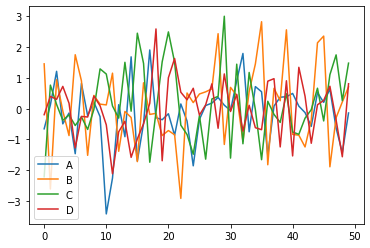

In [3]:
### matplotlib plot
df_1.plot()

In [4]:
### plotly plot
df_1.iplot()

### Line Plots

In [5]:
import plotly.graph_objects as go
df_stocks = px.data.stocks()
# px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y': 'Price'})

px.line(df_stocks, x='date', y= ['GOOG', 'AAPL'], 
        labels = {'x': 'Date', 'y': 'Prices'}, title = 'AAPL vs GOOG'
       )

In [6]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL,
                        mode='lines', name = 'Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG,
                        mode='lines+markers', name = 'Google'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN,
                        mode='lines', name = 'Amazon', 
                        line = dict(color='firebrick', width=2, dash='dashdot')))

fig.update_layout(title = 'Stock Prices of Companies', 
                  xaxis_title = 'Price', 
                  yaxis_title = 'Date'
                 )

In [7]:
fig.update_layout(
    xaxis = dict(
        showline = True, 
        showgrid = False, 
        showticklabels = True, 
        linecolor = 'rgb(204, 204, 204)', 
        linewidth = 2, 
        ticks = 'outside', 
        tickfont = dict(
            family = 'Arial', 
            size = 12, 
            color = 'rgb(82, 82, 82)',
        )
    ),
    yaxis = dict(
        showgrid = False, 
        zeroline = False, 
        showline = False, 
        showticklabels = False
    ), 
    autosize = False, 
    margin = dict(
        autoexpand = False, 
        l = 100, 
        r = 20, 
        t = 110,
    ),
    showlegend = False, 
    plot_bgcolor = 'white'
)

### Bar Charts

In [8]:
df_in = px.data.gapminder().query("country == 'India'")
px.bar(df_in, x = 'year', y = 'pop')

In [9]:
df_tips = px.data.tips()
px.bar(df_tips, 
       x = 'day', 
       y = 'tip', 
       color = 'sex', 
       title = 'Tips by Sex on Each Day', 
       labels = {'tip': 'Tips on Each Day'}
      )

In [10]:
px.bar(df_tips, 
       x = 'sex', 
       y = 'total_bill', 
       color = 'smoker', 
       barmode = 'group'
      )

In [11]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe, 
             y = 'pop', 
             x = 'country', 
             text = 'pop', 
             color = 'country'
            )
fig

In [12]:
fig.update_traces(texttemplate='%{text:.2s}', 
                  textposition = 'outside', 
                 )
fig.update_layout(uniformtext_minsize = 8,
                  xaxis_tickangle = -45
                 )

### Scatter plots

In [13]:
df_iris = px.data.iris()
px.scatter(
    df_iris, 
    x = 'sepal_width', 
    y = 'sepal_length', 
    color = 'species', 
    size = 'petal_length', 
    hover_data = ['petal_width']
)

In [14]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x = df_iris.sepal_width,
        y = df_iris.sepal_length, 
        mode = 'markers', 
        marker_color = df_iris.sepal_width, 
        text = df_iris.species, 
        marker = dict(
            showscale = True
        )
    )
)

In [15]:
fig.update_traces(marker_line_width = 2, 
                 marker_size = 10)

In [16]:
# scattergl for large datasets
fig = go.Figure(
    data = go.Scattergl(
        x = np.random.randn(100000),
        y = np.random.randn(100000), 
        mode = 'markers', 
        marker = dict(color = np.random.randn(100000), 
            colorscale = 'Viridis', 
            line_width = 1
        )
    )
)
fig

### Pie Chart

In [17]:
df_asia = px.data.gapminder().query('year == 2007').query('continent == "Asia"').query('pop > 10000000')
px.pie(df_asia,
       values = 'pop', 
       names = 'country', 
       title = 'Population of Asian Continent', 
       color_discrete_sequence = px.colors.sequential.RdBu
      )

In [18]:
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown', 'grey']
fig = go.Figure(data=[go.Pie(labels=['Water', 'Grass', 'Dark', 'Psychic', 'Fire', 'Ground', 'Normal'],
                             values = [50, 40, 60, 69, 33, 78, 52]
                            )])
fig

In [19]:
fig.update_traces(hoverinfo = 'label+percent', 
                  textfont_size=15, 
                  textinfo = 'label+percent', 
                  pull = [0.1, 0, 0.2, 0, 0, 0, 0], 
                  marker = dict(colors=colors, line=dict(color = '#FFFFFF'))
                 )

### Histograms

In [20]:
dice_1 = np.random.randint(1, 7, 8000)
dice_2 = np.random.randint(1, 7, 8000)
dice_sum = dice_1 + dice_2
fig = px.histogram(dice_sum, 
                   nbins = 11, 
                   labels = {'value': 'Dice Roll'}, 
                   title = '8000 Dice Roll Histogram', 
                   marginal = 'violin', 
                   color_discrete_sequence = ['green']
                  )
fig

In [21]:
fig.update_layout(
    xaxis_title_text = 'Dice Sum', 
    yaxis_title_text = 'Frequency', 
    bargap = 0.1, 
    showlegend = False
)

In [22]:
px.histogram(df_tips, x = 'total_bill', color = 'sex')

### Box Plots

In [23]:
px.box(df_tips, 
       x = 'sex', 
       y = 'tip', 
       points = 'all', 
       color = 'sex'
      )

In [24]:
px.box(df_tips, x= 'day', y= 'tip', points= 'all', color='sex')

In [25]:
fig = go.Figure()
fig.add_trace(
    go.Box(
        x= df_tips.sex, 
        y= df_tips.tip, 
#         marker_color= 'blue', 
        boxmean = 'sd'
    )
)
fig

In [34]:
df_stocks = px.data.stocks()
fig = go.Figure()
fig.add_trace(
    go.Box(
        y=df_stocks.GOOG, 
        boxpoints= 'all', 
        marker_color= 'green', 
        jitter= 0.5, 
        whiskerwidth= 0.2, 
        name= 'Google'
    )
)


fig.add_trace(
    go.Box(
        y=df_stocks.AAPL, 
        boxpoints= 'all', 
#         fillcolor= 'black', 
        marker_color= 'black',
        jitter= 0.5, 
        whiskerwidth= 0.2, 
        name= 'Apple'
    )
)

fig.update_layout(
    title= 'Google vs Apple', 
    yaxis= dict(gridcolor= 'rgb(255, 255, 255)', gridwidth= 3),
    paper_bgcolor= 'rgb(243, 243, 243)',    
    plot_bgcolor= 'rgb(243, 243, 243)'  
)

### Violin Plots

In [38]:
df_tips = px.data.tips()
px.violin(df_tips, 
          y= 'total_bill', 
          box= True, 
          points= 'all'
         )

In [40]:
px.violin(df_tips, 
          y= 'tip', 
          x= 'smoker', 
          color= 'sex', 
          box= True, 
          points= 'all', 
          hover_data= df_tips.columns
         )

In [43]:
fig= go.Figure()
fig.add_trace(go.Violin(
    x= df_tips.day[df_tips.smoker=='Yes'], 
    y= df_tips.total_bill[df_tips.smoker=='Yes'], 
    legendgroup= 'Yes', 
    scalegroup= 'Yes', 
    name= 'Yes', 
    side= 'negative', 
    line_color= 'orange'
))
fig.add_trace(go.Violin(
    x= df_tips.day[df_tips.smoker=='No'], 
    y= df_tips.total_bill[df_tips.smoker=='No'], 
    legendgroup= 'Yes', 
    scalegroup= 'Yes', 
    name= 'No', 
    side= 'positive', 
    line_color= 'green'
))

### Density Heatmaps

In [51]:
flight = sns.load_dataset('flights')
flight.describe()

fig = px.density_heatmap(flight, 
                         x= 'year', 
                         y= 'month', 
                         z= 'passengers',
                         color_continuous_scale= 'Viridis', 
                        )
fig

In [53]:
fig = px.density_heatmap(flight, 
                         x= 'year', 
                         y= 'month', 
                         z= 'passengers',
                         marginal_x= 'histogram', 
                         marginal_y= 'histogram'
                        )
fig

### 3D Scatter Plot

In [55]:
fig = px.scatter_3d(flight, 
                    x = 'year', 
                    y = 'month', 
                    z = 'passengers', 
                    color = 'year', 
                    opacity = 0.7,
                   )
fig

In [58]:
fig = px.line_3d(flight, 
                    x = 'year', 
                    y = 'month', 
                    z = 'passengers', 
                    color = 'year', 
#                     opacity = 0.7,
                   )
fig

### Scatter Matrix

In [60]:
fig = px.scatter_matrix(flight, 
                        color= 'month', 
                       )
fig

### Map Scatter Plot

In [69]:
df = px.data.gapminder().query('year == 2007')
fig = px.scatter_geo(df, 
                     locations= "iso_alpha", 
                     color= 'continent', 
                     hover_name= 'country', 
                     size= 'pop', 
                     projection= 'orthographic'
                    )
fig

### Polar Charts

In [71]:
df_wind = px.data.wind()
px.scatter_polar(df_wind, 
                r= 'frequency', 
                theta= 'direction', 
                color= 'strength', 
                size= 'frequency', 
                symbol= 'strength'
               )

In [72]:
px.line_polar(df_wind, 
              r= 'frequency', 
              theta= 'direction', 
              color= 'strength', 
              line_close= True,
              template= 'plotly_dark'
             )

### Ternary Plots

In [74]:
df_exp = px.data.experiment()
px.scatter_ternary(df_exp, 
           a= 'experiment_1',
           b= 'experiment_2',
           c= 'experiment_3', 
           hover_name= 'group', 
           color= 'gender'
)

### Facet Plots

In [75]:
df_tips = px.data.tips()
px.scatter(df_tips, 
           x = 'total_bill', 
           y = 'tip', 
           color= 'smoker', 
           facet_col = 'sex'
          )

In [77]:
px.histogram(df_tips, 
             x = 'total_bill', 
             y = 'tip', 
             color = 'sex', 
             facet_row = 'time', 
             facet_col = 'day', 
             category_orders = {'time': ['Lunch', 'Dinner'], 
                                'day': ['Thur', 'Fri', 'Sat', 'Sun']
                               }
            )

In [84]:
df_att = sns.load_dataset('attention')
fig = px.line(df_att, 
              x = 'solutions', 
              y = 'score', 
              facet_col = 'subject', 
              facet_col_wrap = 5,
              title = 'Scores Based on Attention'
             )
fig

### Animated Plots

In [103]:
df_cnt = px.data.gapminder()
px.scatter(df_cnt, 
           x = 'gdpPercap', 
           y = 'lifeExp', 
           animation_frame = 'year', 
           animation_group = 'country', 
           color = 'continent', 
           hover_name = 'country', 
           size = 'pop', 
           log_x = True,
           size_max = 32, 
           range_y = [25, 85]
          )

In [109]:
px.bar(df_cnt,
       x = 'continent', 
       y = 'pop', 
       animation_frame = 'year', 
       animation_group = 'country', 
       hover_name = 'country', 
#        log_y = True, 
       color = 'continent', 
       range_y = [0, 4*10**9]
      )

In [110]:
df_cnt.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
